# Advanced Deep learning modelling

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
! pip3 install tensorflow==2.2.0
! pip3 install keras==2.3.1
! pip3 install -U segmentation-models

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 516.2 MB 3.9 kB/s 
     |████████████████████████████████| 2.9 MB 45.3 MB/s 
     |████████████████████████████████| 454 kB 57.2 MB/s 
     |████████████████████████████████| 3.0 MB 40.7 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.3
    Uninstalling gast-0.5.3:
      Successfully uninstalled gast-0.5.3


In [3]:
#import libraries

import numpy as np
import pandas as pd
import json
from zipfile import ZipFile
from tqdm import tqdm
import matplotlib.pyplot as plt
import cv2 as cv
import os
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,LearningRateScheduler,ReduceLROnPlateau
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda, Activation,Concatenate,MaxPool2D
from skimage.filters import threshold_otsu
import json

%env SM_FRAMEWORK=tf.keras
tf.keras.backend.set_image_data_format('channels_last')
import segmentation_models as sm
from segmentation_models import Unet
from segmentation_models.metrics import iou_score

env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


# 1. Reading the preprocessed image datasets

In [4]:
#Extract all the resized archived files

ra = ZipFile("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/ResizeArchive.zip","r")
ra.extractall()

In [5]:
#Read the metadata file which contains paths of normal satellite images and mask paths

df = pd.read_csv('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/metadata.csv')
df.head()

,image_id,split,sat_image_path,mask_path
0,100034,train,train/100034_sat.jpg,train/100034_mask.png
1,100081,train,train/100081_sat.jpg,train/100081_mask.png
2,100129,train,train/100129_sat.jpg,train/100129_mask.png
3,100703,train,train/100703_sat.jpg,train/100703_mask.png
4,100712,train,train/100712_sat.jpg,train/100712_mask.png


In [ ]:
#valid dataset doesn't contain the mask images so we shall use fraction of train dataset for valid purpose

#prepare the valid and train index for splitting the dataframe into train and valid datasets
train_data = df[df['split'] == 'train']
valid_index = train_data.sample(frac=0.20,random_state=42).index.to_list()
train_index = [each for each in train_data.index.to_list() if each not in valid_index]

#create the train and valid dataframes 
train_df = train_data.filter(items=train_index, axis=0)
valid_df = train_data.filter(items=valid_index, axis=0)

In [ ]:
#print the number of data points both in train and valid datasets

print('Number of data points in train_df - '+str(train_df.shape[0]))
print('Number of data points in valid_df - '+str(valid_df.shape[0]))

Number of data points in train_df - 4981
Number of data points in valid_df - 1245


# 2. Data Generator

In [ ]:
#Augmentation techniques

import imgaug.augmenters as iaa

aug1 = iaa.Fliplr(1)
aug2 = iaa.Flipud(1)

In [ ]:
class Dataset:
    def __init__(self, df, Augment=False):
        
        self.df = df
        self.Augment = Augment
        self.sat_images_path_list = self.df['sat_image_path'].to_list() 
        self.mask_images_path_list = self.df['mask_path'].to_list()
        self.class_values = [0,255] 
    
    def __getitem__(self, i):
        
        # read image directly into RGB format
        image = cv.imread(self.sat_images_path_list[i])
        image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

        # read image mask
        image_mask  = cv.imread(self.mask_images_path_list[i])
        image_mask = image_mask[:,:,0]
        image_masks = [(image_mask == v) for v in self.class_values]
        image_mask = np.stack(image_masks, axis=-1).astype('float')

        if self.Augment == True:
          x = np.random.uniform()
          if x<0.3:
            image = aug1.augment_image(image)
            image_mask = aug1.augment_image(image_mask)
          elif x<0.6:
            image = aug2.augment_image(image)
            image_mask = aug2.augment_image(image_mask)
          else:
            pass
        
        return image, image_mask
    
    def __len__(self):
        return len(self.df)

In [ ]:
class DataLoader(tf.keras.utils.Sequence):    
    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

    def __getitem__(self, i):
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])
        
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]
        
        return tuple(batch)
    
    def __len__(self):
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

# 3. Training

In [ ]:
def train_model(model, backbone, Augment, root_folder):
  
  if model is None:
    model = Unet(backbone, encoder_weights='imagenet', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)

  train_dataset = Dataset(train_df, Augment = Augment)
  valid_dataset = Dataset(valid_df, Augment = Augment)

  train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
  valid_dataloader = DataLoader(valid_dataset, batch_size=32, shuffle=True)

  focal_loss = sm.losses.cce_dice_loss
  model.compile(optimizer = Adam(0.001), loss=focal_loss, metrics=[iou_score]) 

  # define callbacks for learning rate scheduling and best checkpoints saving
  filepath = '/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/'+ root_folder +'/weights-{epoch:02d}-{val_iou_score:.3f}.h5'
  callbacks = [ModelCheckpoint(filepath=filepath, save_weights_only=True, save_best_only=True,mode='max', monitor='val_iou_score',verbose=1),
               EarlyStopping(monitor='val_iou_score',min_delta=0.001,patience=4,mode='max',verbose=1)]
  
  history = model.fit(x=train_dataloader,steps_per_epoch=len(train_dataloader),epochs=25,validation_data=valid_dataloader,callbacks=callbacks)

  return history

# 4. Plot performance of metrics

In [ ]:
# Plot training & validation iou_score and loss metric values

def plot_performance(history):
  plt.figure(figsize=(30, 5))
  plt.subplot(121)
  plt.plot(history.history['iou_score'])
  plt.plot(history.history['val_iou_score'])
  plt.title('Model IOU')
  plt.ylabel('iou')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'valid'], loc='upper left')

  # Plot training & validation loss values
  plt.subplot(122)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'val'], loc='upper left')
  plt.show()
  
  return None

# 5. Prediction of validation images

In [ ]:
def predict_valid(model,n):

  # paths of images
  sat_images_path_list = valid_df['sat_image_path'][0:n].to_list()

  # paths of masked images
  mask_images_path_list = valid_df['mask_path'][0:n].to_list()

  for sat_img_path, mask_img_path in zip(sat_images_path_list, mask_images_path_list):

      # original image
      sat_img = cv.imread(sat_img_path)
      sat_img = cv.cvtColor(sat_img, cv.COLOR_BGR2RGB)

      # mask image
      mask_img = cv.imread(mask_img_path)

      # prediction
      predict_proba  = model.predict(sat_img[np.newaxis,:,:,:])
      predict_mask = tf.argmax(predict_proba, axis=-1)
      
      # titles
      sat_title = sat_img_path.split('/')[1]
      mask_title = mask_img_path.split('/')[1]
      
      # plotting figure
      plt.figure(figsize=(10, 10))
      
      plt.subplot(1,3,1)
      plt.title(sat_title)
      plt.imshow(sat_img, cmap='gray')

      plt.subplot(1,3,2)
      plt.title(mask_title)
      plt.imshow(mask_img, cmap='gray')

      plt.subplot(1,3,3)
      plt.title("Prediction")
      plt.imshow(predict_mask[0], cmap='gray')
      
      plt.show()
  
  return None

# 6. Prediction of test images

In [ ]:
def predict_test(model,n):
  
  test_df = df[df['split'] == 'test']

  # paths of images
  sat_images_path_list = test_df['sat_image_path'][0:n].to_list()

  for sat_img_path in sat_images_path_list:

      # original image
      sat_img = cv.imread(sat_img_path)
      sat_img = cv.cvtColor(sat_img, cv.COLOR_BGR2RGB)

      # prediction
      predict_proba  = model.predict(sat_img[np.newaxis,:,:,:])
      predict_mask = tf.argmax(predict_proba, axis=-1)
      
      # titles
      sat_title = sat_img_path.split('/')[1]
      
      # plotting figure
      plt.figure(figsize=(10, 10))
      
      plt.subplot(1,2,1)
      plt.title(sat_title)
      plt.imshow(sat_img, cmap='gray')

      plt.subplot(1,2,2)
      plt.title("Prediction")
      plt.imshow(predict_mask[0], cmap='gray')
      
      plt.show()
  
  return None

# 7. Custom U-Net 

In [ ]:
#reference - https://github.com/bnsreenu/python_for_microscopists/blob/master/219-unet_model_with_functions_of_blocks.py

def conv_block(input, num_filters):

    x = Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(input)
    x = BatchNormalization()(x)   #Not in the original network. 
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)  #Not in the original network
    x = Activation("relu")(x)

    return x

#Encoder block: Conv block followed by maxpooling

def encoder_block(input, num_filters):
    x = conv_block(input, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p   

#Decoder block
#skip features gets input from encoder for concatenation

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

#Build Unet using the blocks

def build_unet(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024) #Bridge

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(2, 1, padding="same", activation="softmax")(d4)  

    model = Model(inputs, outputs, name="U-Net")
    return model


# 8. Training models - No Augmentation

## 8.1 Resnet34

### 8.1.1 Training

In [ ]:
history = train_model(backbone ='resnet34', Augment = False, root_folder = 'Resnet_34_no_augment')

Epoch 1/25
155/155 [==============================] - ETA: 0s - loss: 0.4564 - iou_score: 0.5482
Epoch 00001: val_iou_score improved from -inf to 0.57220, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/Resnet_34_no_augment/weights-01-0.572.h5
155/155 [==============================] - 71s 455ms/step - loss: 0.4564 - iou_score: 0.5482 - val_loss: 0.4079 - val_iou_score: 0.5722
Epoch 2/25
155/155 [==============================] - ETA: 0s - loss: 0.3219 - iou_score: 0.6464
Epoch 00002: val_iou_score improved from 0.57220 to 0.58623, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/Resnet_34_no_augment/weights-02-0.586.h5
155/155 [==============================] - 72s 465ms/step - loss: 0.3219 - iou_score: 0.6464 - val_loss: 0.4109 - val_iou_score: 0.5862
Epoch 3/25
155/155 [==============================] - ETA: 0s - loss: 0.2956 - iou_score: 0.6682
Epoch 00003: val_iou_score improved from 0.58623 to 0.66036, s

In [ ]:
#save metrics

#file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/Resnet_34_no_augment/history.json", "w")
#json.dump(history.history, file)
#file.close()

### 8.1.2 Plot performance

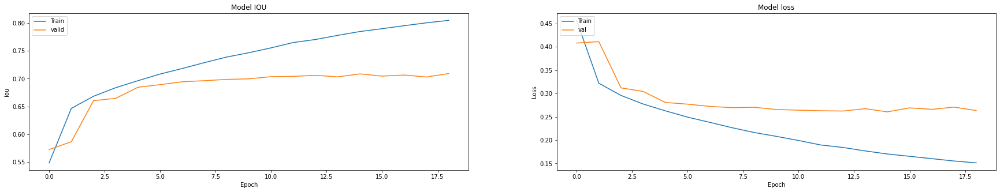

In [ ]:
plot_performance(history)

In [ ]:
model = Unet('resnet34', encoder_weights='imagenet', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)

In [ ]:
model.load_weights('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/Resnet_34_no_augment/weights-19-0.709.h5')

### 8.1.3 Prediction on valid images

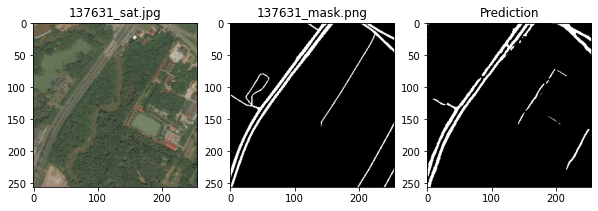

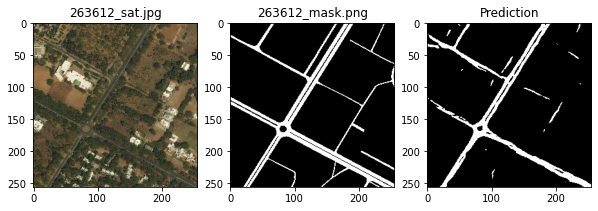

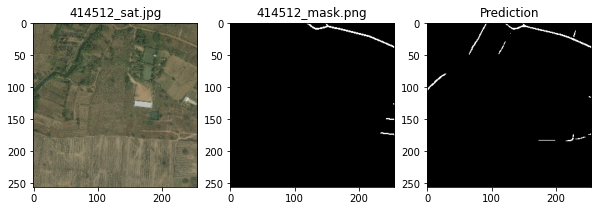

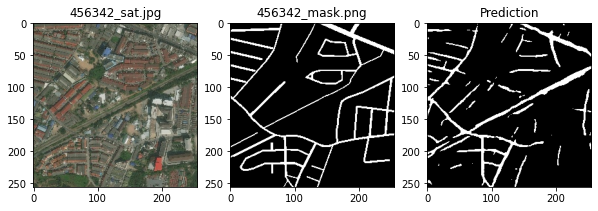

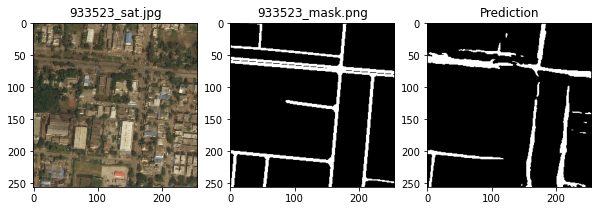

In [ ]:
predict_valid(model,n=5)

### 8.1.4 Prediction on test images

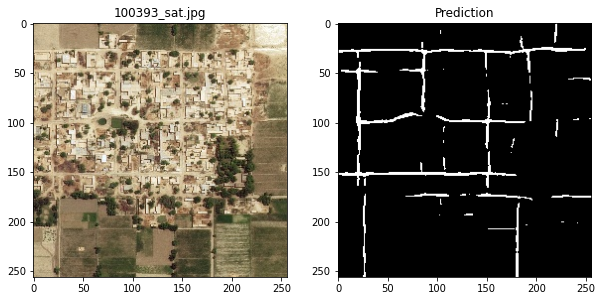

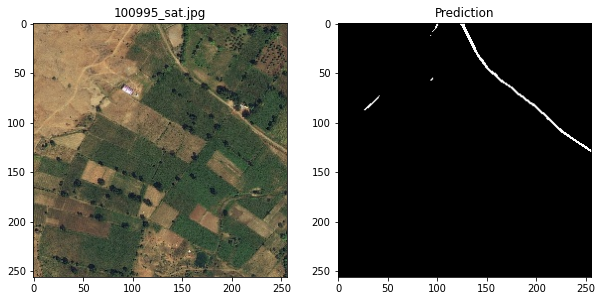

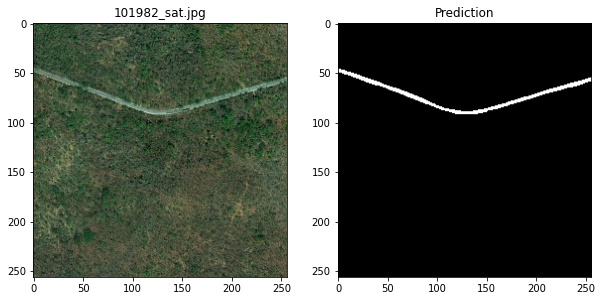

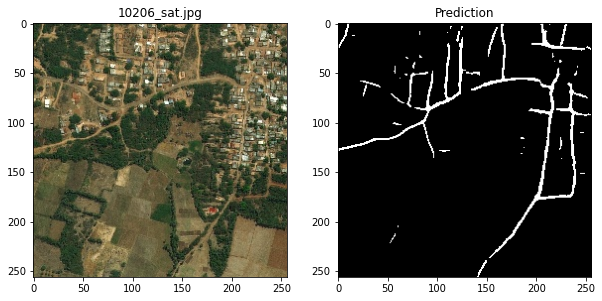

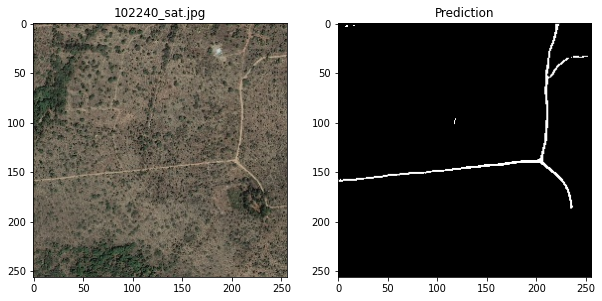

In [ ]:
predict_test(model,n=5)

## 8.2 VGG16

### 8.2.1 Training

In [ ]:
history = train_model(backbone ='vgg16', Augment = False, root_folder='vgg_16_no_augment')

Epoch 1/25
155/155 [==============================] - ETA: 0s - loss: 0.4338 - iou_score: 0.5628
Epoch 00001: val_iou_score improved from -inf to 0.59826, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/vgg_16_no_augment/weights-01-0.598.h5
155/155 [==============================] - 75s 484ms/step - loss: 0.4338 - iou_score: 0.5628 - val_loss: 0.3801 - val_iou_score: 0.5983
Epoch 2/25
155/155 [==============================] - ETA: 0s - loss: 0.3221 - iou_score: 0.6463
Epoch 00002: val_iou_score improved from 0.59826 to 0.64764, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/vgg_16_no_augment/weights-02-0.648.h5
155/155 [==============================] - 78s 501ms/step - loss: 0.3221 - iou_score: 0.6463 - val_loss: 0.3214 - val_iou_score: 0.6476
Epoch 3/25
155/155 [==============================] - ETA: 0s - loss: 0.2985 - iou_score: 0.6659
Epoch 00003: val_iou_score improved from 0.64764 to 0.66307, saving 

In [ ]:
#save metrics

#file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/vgg_16_no_augment/history.json", "w")
#json.dump(history.history, file)
#file.close()

### 8.2.2 Plot performance

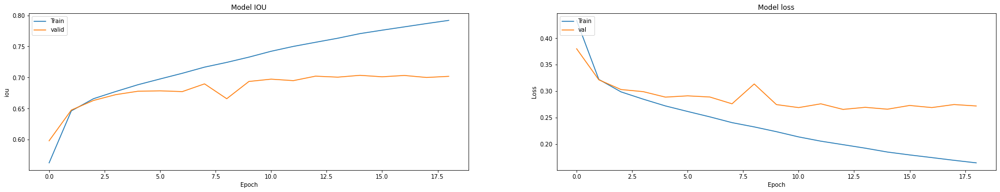

In [ ]:
plot_performance(history)

In [ ]:
model = Unet('vgg16', encoder_weights='imagenet', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)

58892288/58889256 [==============================] - 0s 0us/step


In [ ]:
model.load_weights('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/vgg_16_no_augment/weights-15-0.703.h5')

### 8.2.3 Prediction on valid images

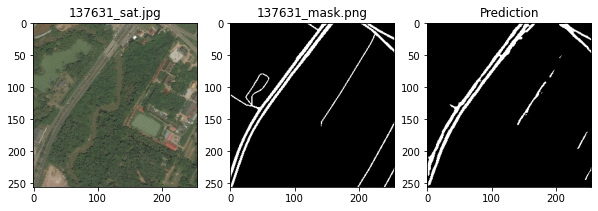

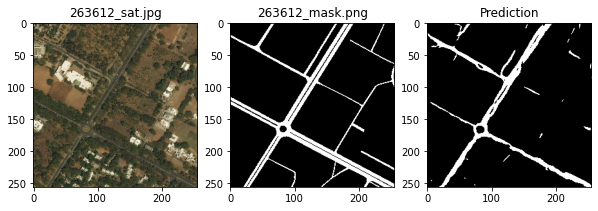

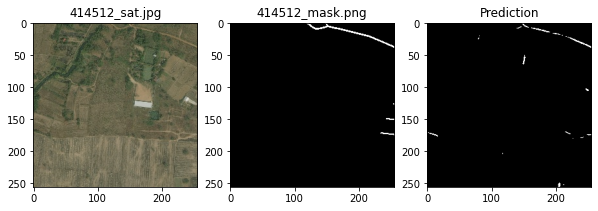

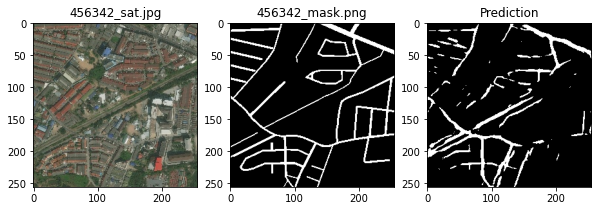

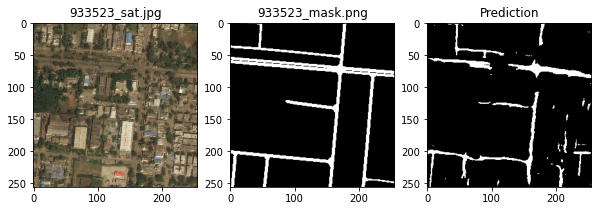

In [ ]:
predict_valid(model,n=5)

### 8.2.4 Prediction on test images

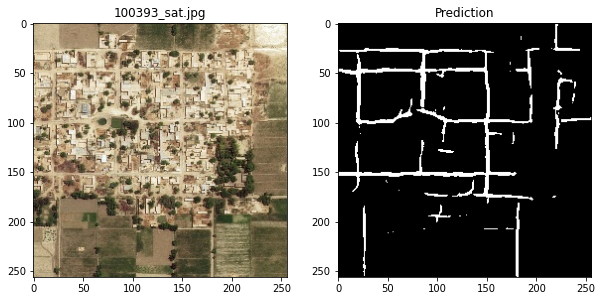

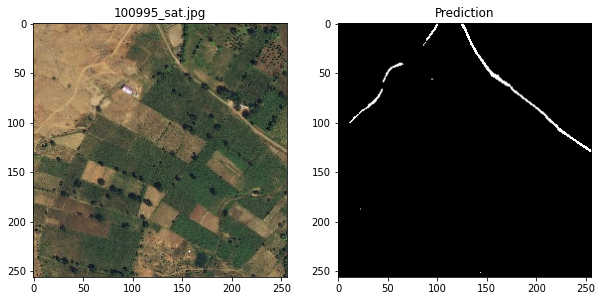

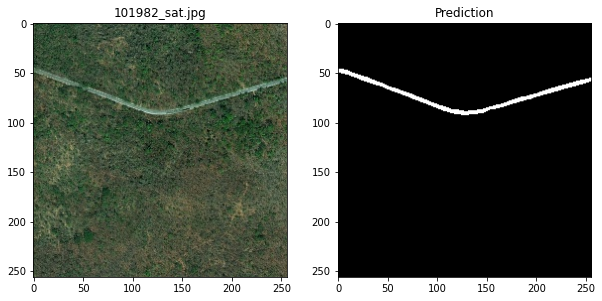

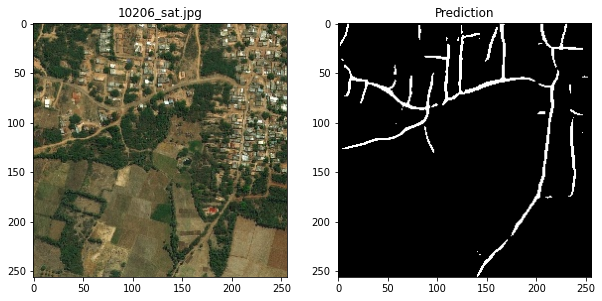

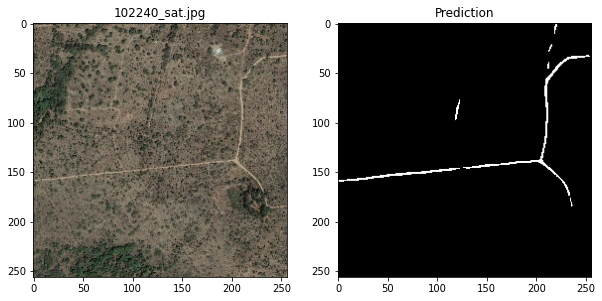

In [ ]:
predict_test(model,n=5)

## 8.3 InceptionV3

### 8.3.1 Training

In [ ]:
history = train_model(backbone ='inceptionv3', Augment = False, root_folder ='InceptionV3_no_augment')

87916544/87910968 [==============================] - 2s 0us/step
Epoch 1/25
155/155 [==============================] - ETA: 0s - loss: 0.3902 - iou_score: 0.5943
Epoch 00001: val_iou_score improved from -inf to 0.62840, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/InceptionV3_no_augment/weights-01-0.628.h5
155/155 [==============================] - 93s 602ms/step - loss: 0.3902 - iou_score: 0.5943 - val_loss: 0.3426 - val_iou_score: 0.6284
Epoch 2/25
155/155 [==============================] - ETA: 0s - loss: 0.3063 - iou_score: 0.6592
Epoch 00002: val_iou_score improved from 0.62840 to 0.66162, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/InceptionV3_no_augment/weights-02-0.662.h5
155/155 [==============================] - 92s 594ms/step - loss: 0.3063 - iou_score: 0.6592 - val_loss: 0.3008 - val_iou_score: 0.6616
Epoch 3/25
155/155 [==============================] - ETA: 0s - loss: 0.2799 - iou_score: 

In [ ]:
#save metrics

#file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/InceptionV3_no_augment/history.json", "w")
#json.dump(history.history, file)
#file.close()

### 8.3.2 Plot performance

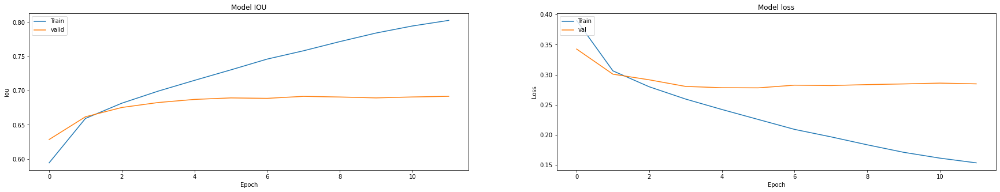

In [ ]:
plot_performance(history)

In [ ]:
model = Unet('inceptionv3', encoder_weights='imagenet', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)

87916544/87910968 [==============================] - 1s 0us/step


In [ ]:
model.load_weights('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/InceptionV3_no_augment/weights-12-0.692.h5')

### 8.3.3 Prediction on valid images

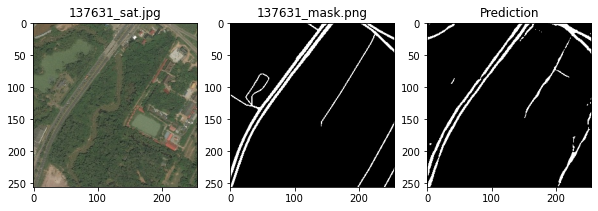

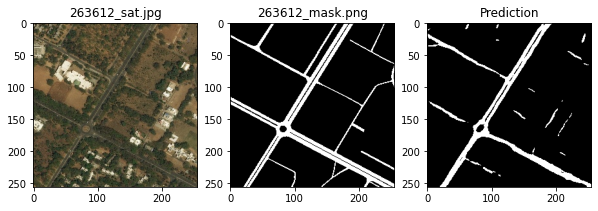

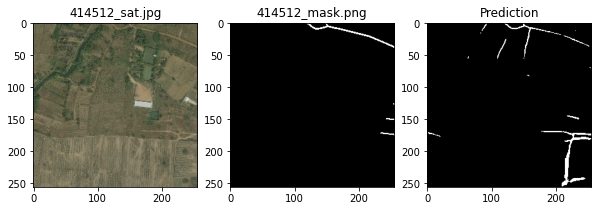

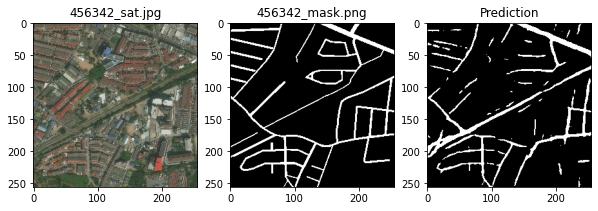

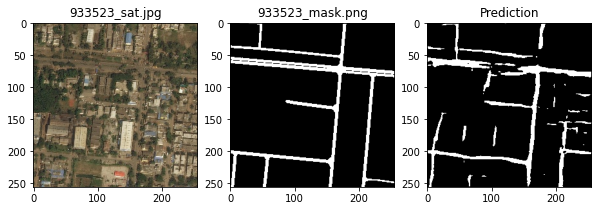

In [ ]:
predict_valid(model,n=5)

### 8.3.4 Prediction on test images

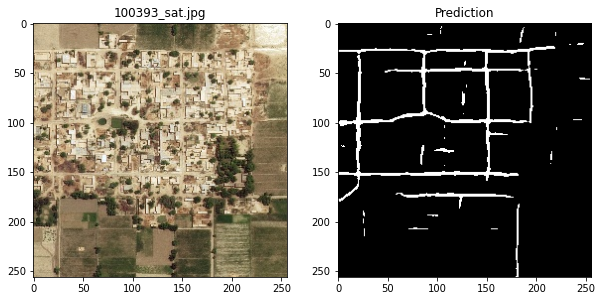

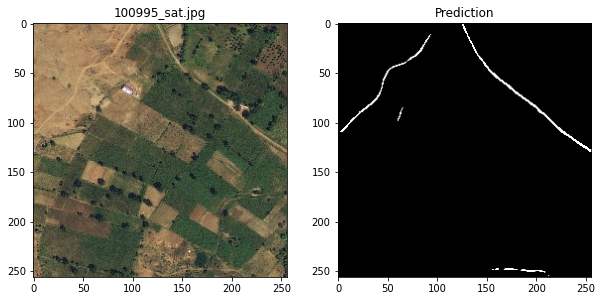

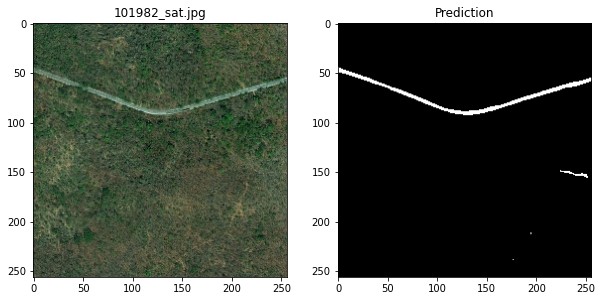

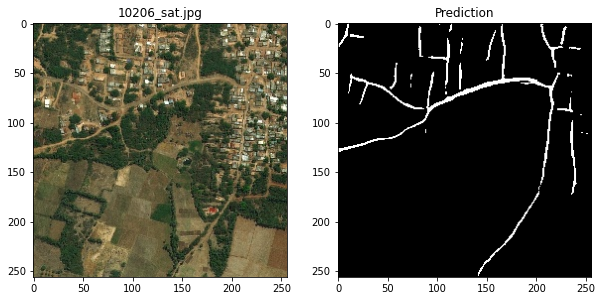

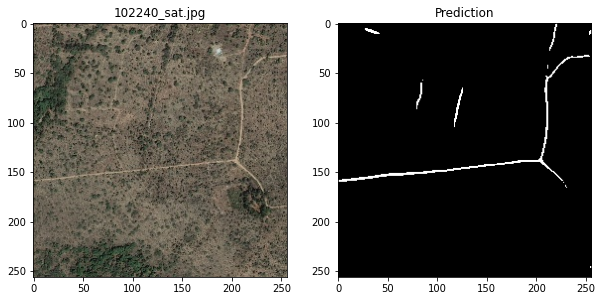

In [ ]:
predict_test(model,n=5)

## 8.4 Densenet

### 8.4.1 Training

In [ ]:
history = train_model(backbone ='densenet201', Augment = False, root_folder = 'densenet_201_no_augment')

74842112/74836368 [==============================] - 3s 0us/step
Epoch 1/25
155/155 [==============================] - ETA: 0s - loss: 0.4873 - iou_score: 0.5346
Epoch 00001: val_iou_score improved from -inf to 0.51730, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/densenet_201_no_augment/weights-01-0.517.h5
155/155 [==============================] - 135s 868ms/step - loss: 0.4873 - iou_score: 0.5346 - val_loss: 0.5081 - val_iou_score: 0.5173
Epoch 2/25
155/155 [==============================] - ETA: 0s - loss: 0.3177 - iou_score: 0.6498
Epoch 00002: val_iou_score improved from 0.51730 to 0.58365, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/densenet_201_no_augment/weights-02-0.584.h5
155/155 [==============================] - 135s 871ms/step - loss: 0.3177 - iou_score: 0.6498 - val_loss: 0.4138 - val_iou_score: 0.5837
Epoch 3/25
155/155 [==============================] - ETA: 0s - loss: 0.2835 - iou_sco

In [ ]:
#save metrics

#file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/densenet_201_no_augment/history.json", "w")
#json.dump(history.history, file)
#file.close()

### 8.4.2 Plot performance

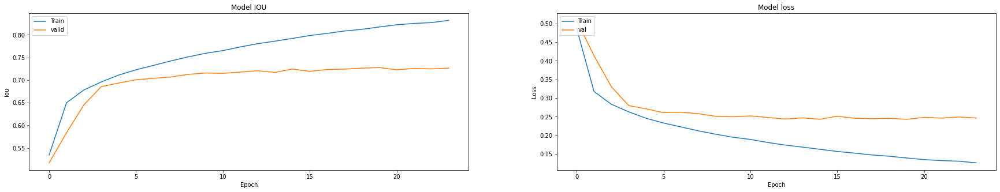

In [ ]:
plot_performance(history)

In [ ]:
model = Unet('densenet201', encoder_weights='imagenet', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)

In [ ]:
model.load_weights('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/densenet_201_no_augment/weights-20-0.728.h5')

### 8.4.3 Prediction on valid images

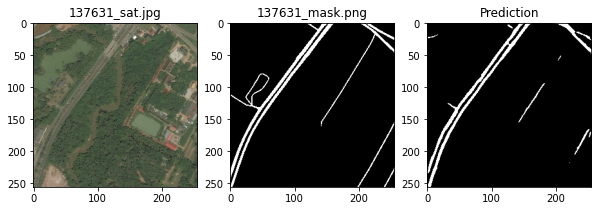

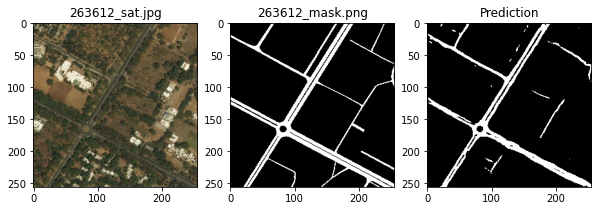

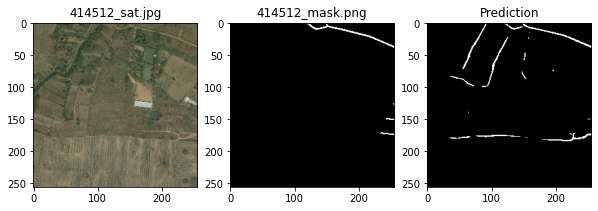

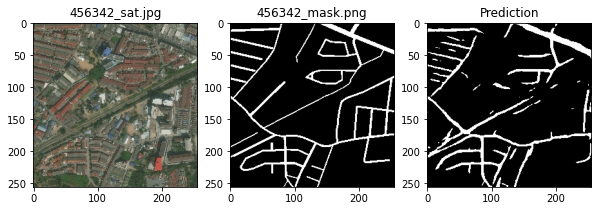

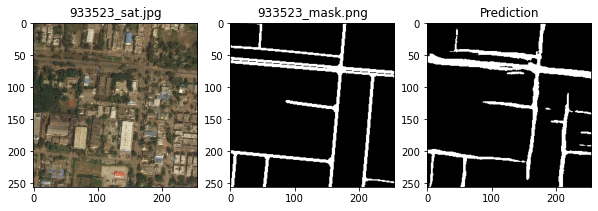

In [ ]:
predict_valid(model,n=5)

### 8.4.4 Prediction on test images

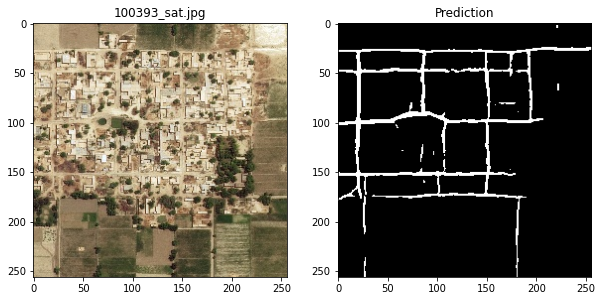

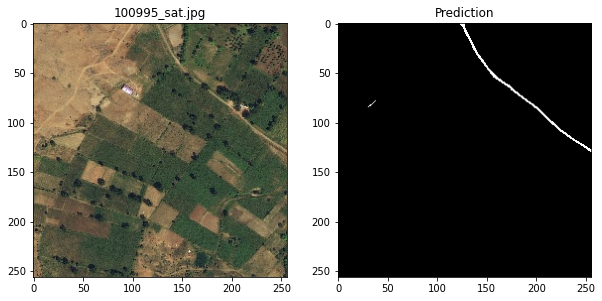

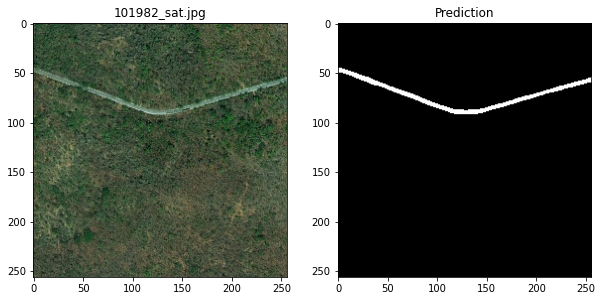

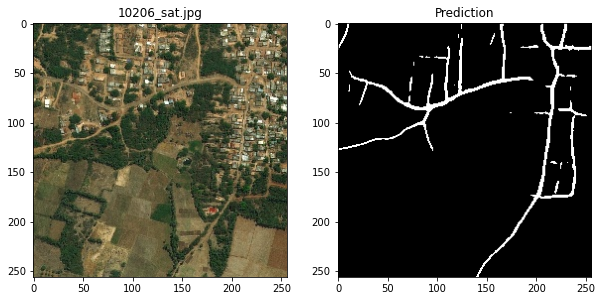

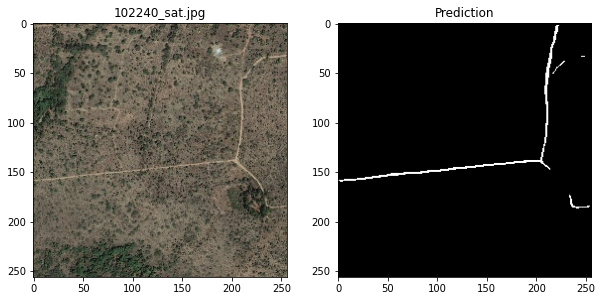

In [ ]:
predict_test(model,n=5)

## 8.5 Custom U-Net 

### 8.5.1 Training

In [ ]:
#created a model that takes input shape as (256,256,3)

model_unet = build_unet((256,256,3))

In [ ]:
history = train_model(model = model_unet, backbone = None, Augment = False, root_folder = 'U_Net_no_augment')

Epoch 1/25
155/155 [==============================] - ETA: 0s - loss: 0.5234 - iou_score: 0.5014
Epoch 00001: val_iou_score improved from -inf to 0.50650, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/U_Net_no_augment/weights-01-0.506.h5
155/155 [==============================] - 279s 2s/step - loss: 0.5234 - iou_score: 0.5014 - val_loss: 0.5253 - val_iou_score: 0.5065
Epoch 2/25
155/155 [==============================] - ETA: 0s - loss: 0.3848 - iou_score: 0.5986
Epoch 00002: val_iou_score improved from 0.50650 to 0.58063, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/U_Net_no_augment/weights-02-0.581.h5
155/155 [==============================] - 281s 2s/step - loss: 0.3848 - iou_score: 0.5986 - val_loss: 0.4176 - val_iou_score: 0.5806
Epoch 3/25
155/155 [==============================] - ETA: 0s - loss: 0.3189 - iou_score: 0.6499
Epoch 00003: val_iou_score improved from 0.58063 to 0.63598, saving model 

In [ ]:
#save metrics

#file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/U_Net_no_augment/history.json", "w")
#json.dump(history.history, file)
#file.close()

### 8.5.2 Plot performance

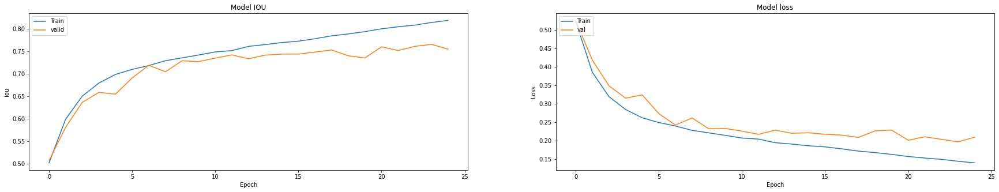

In [ ]:
plot_performance(history)

In [ ]:
model_unet = build_unet((256,256,3))

In [ ]:
model_unet.load_weights('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/U_Net_no_augment/weights-24-0.765.h5')

### 8.5.3 Prediction on valid images

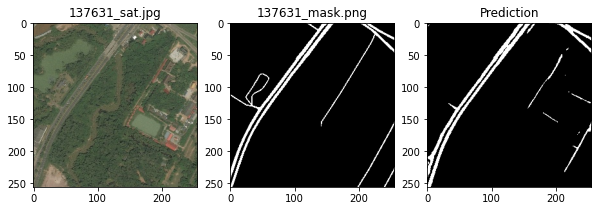

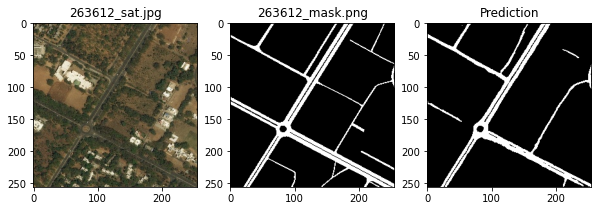

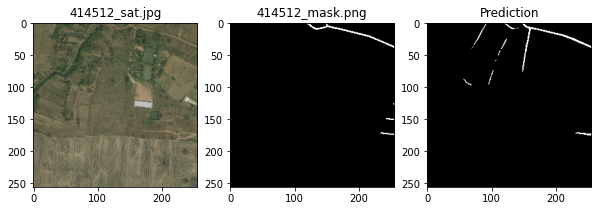

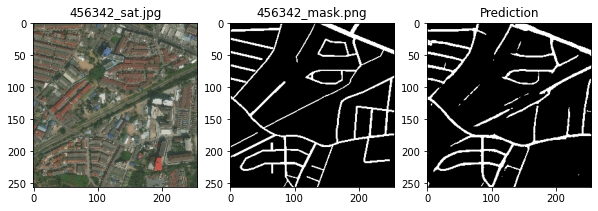

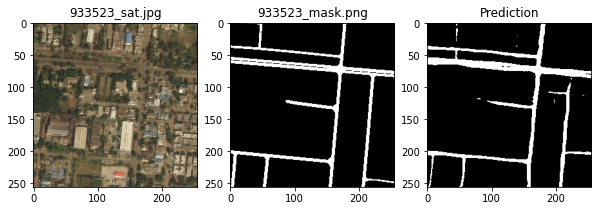

In [ ]:
predict_valid(model_unet,n=5)

### 8.5.4 Prediction on test images

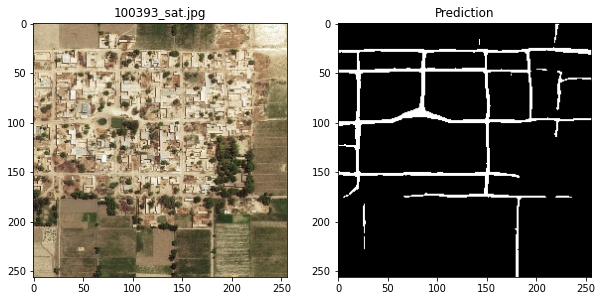

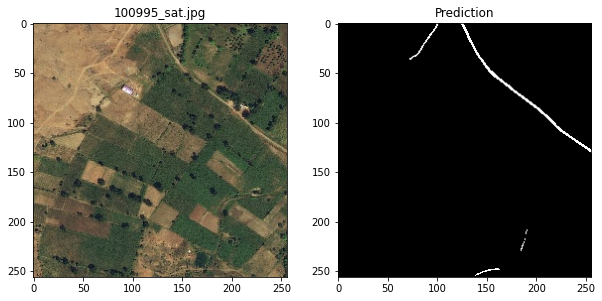

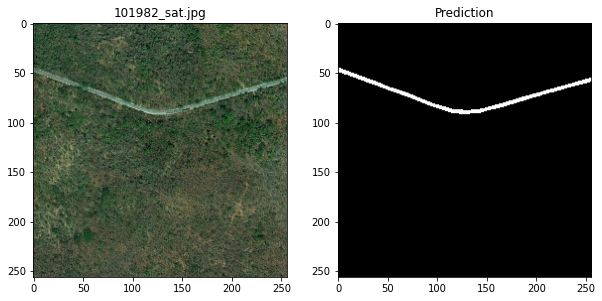

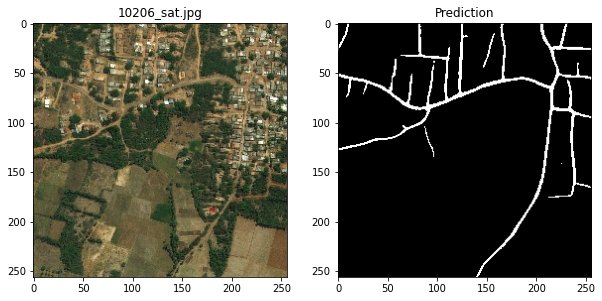

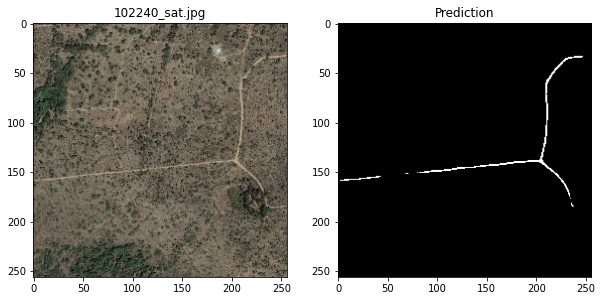

In [ ]:
predict_test(model_unet,n=5)

# 9. Training models - Augmentation

## 9.1 Resnet34

### 9.1.1 Training

In [ ]:
history = train_model(backbone ='resnet34', Augment = True, root_folder = 'Resnet_34_augment')

85524480/85521592 [==============================] - 3s 0us/step
Epoch 1/25
155/155 [==============================] - ETA: 0s - loss: 0.4580 - iou_score: 0.5485
Epoch 00001: val_iou_score improved from -inf to 0.56589, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/Resnet_34_augment/weights-01-0.566.h5
155/155 [==============================] - 75s 481ms/step - loss: 0.4580 - iou_score: 0.5485 - val_loss: 0.4319 - val_iou_score: 0.5659
Epoch 2/25
155/155 [==============================] - ETA: 0s - loss: 0.3348 - iou_score: 0.6365
Epoch 00002: val_iou_score improved from 0.56589 to 0.59682, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/Resnet_34_augment/weights-02-0.597.h5
155/155 [==============================] - 76s 490ms/step - loss: 0.3348 - iou_score: 0.6365 - val_loss: 0.3982 - val_iou_score: 0.5968
Epoch 3/25
155/155 [==============================] - ETA: 0s - loss: 0.3086 - iou_score: 0.6574
Epo

In [ ]:
#save metrics

#file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/Resnet_34_augment/history.json", "w")
#json.dump(history.history, file)
#file.close()

### 9.1.2 Plot performance

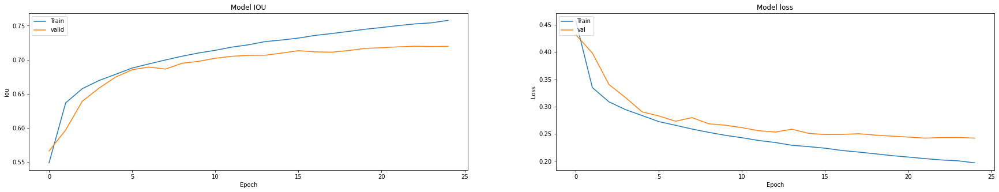

In [ ]:
plot_performance(history)

In [ ]:
model = Unet('resnet34', encoder_weights='imagenet', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)

In [ ]:
model.load_weights('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/Resnet_34_augment/weights-23-0.720.h5')

### 9.1.3 Prediction on valid images

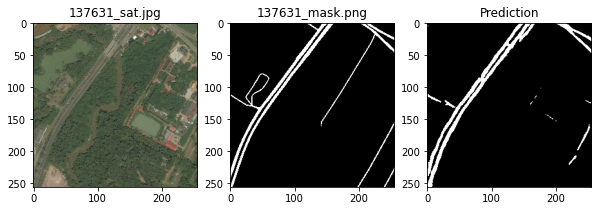

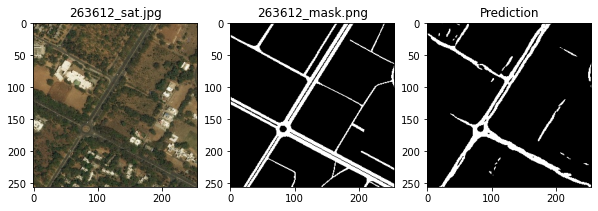

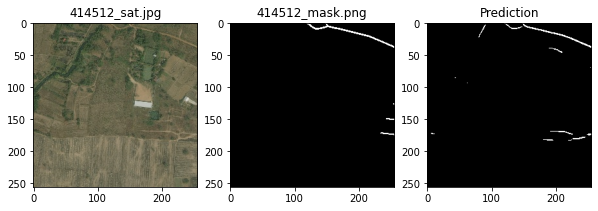

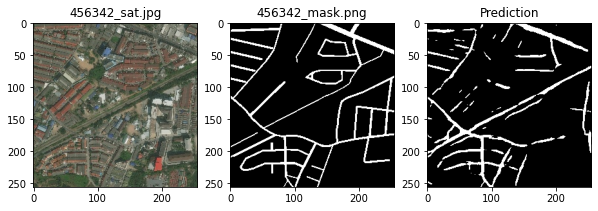

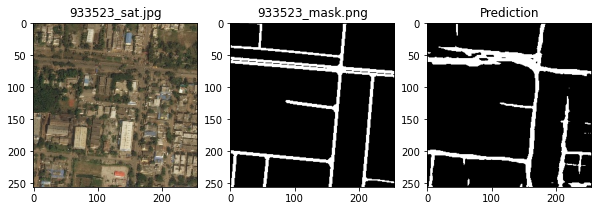

In [ ]:
predict_valid(model,n=5)

### 9.1.4 Prediction on test images

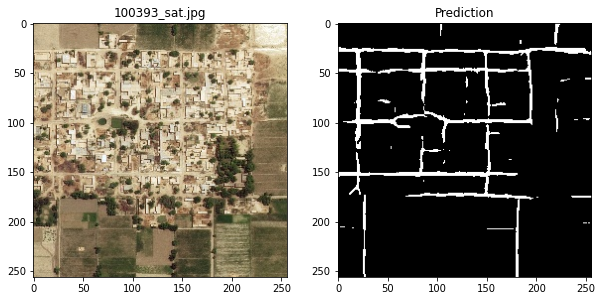

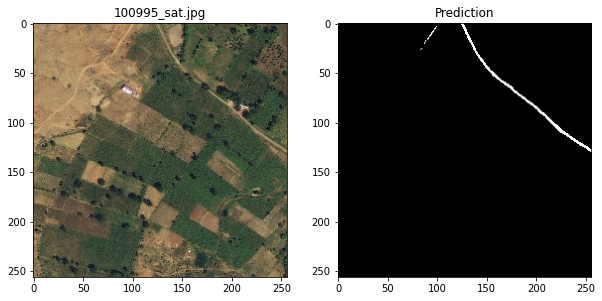

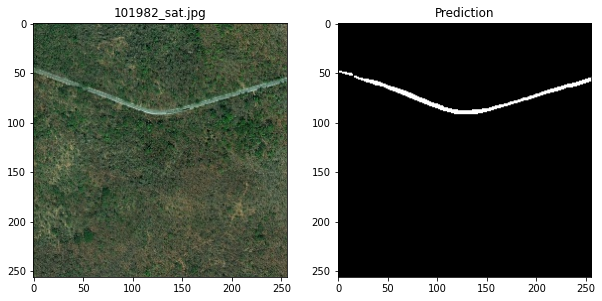

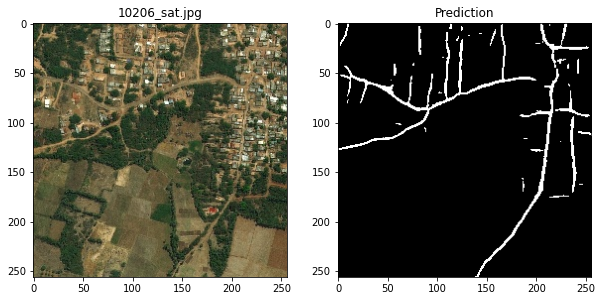

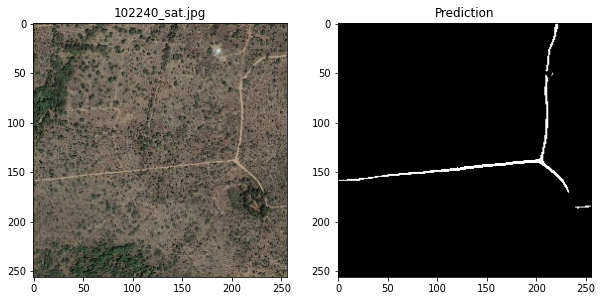

In [ ]:
predict_test(model,n=5)

## 9.2 VGG16

### 9.2.1 Training

In [ ]:
history = train_model(backbone ='vgg16', Augment = True, root_folder='vgg_16_augment')

Epoch 1/25
155/155 [==============================] - ETA: 0s - loss: 0.4435 - iou_score: 0.5570
Epoch 00001: val_iou_score improved from -inf to 0.58591, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/vgg_16_augment/weights-01-0.586.h5
155/155 [==============================] - 86s 557ms/step - loss: 0.4435 - iou_score: 0.5570 - val_loss: 0.3934 - val_iou_score: 0.5859
Epoch 2/25
155/155 [==============================] - ETA: 0s - loss: 0.3343 - iou_score: 0.6370
Epoch 00002: val_iou_score improved from 0.58591 to 0.63203, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/vgg_16_augment/weights-02-0.632.h5
155/155 [==============================] - 86s 553ms/step - loss: 0.3343 - iou_score: 0.6370 - val_loss: 0.3488 - val_iou_score: 0.6320
Epoch 3/25
155/155 [==============================] - ETA: 0s - loss: 0.3117 - iou_score: 0.6553
Epoch 00003: val_iou_score improved from 0.63203 to 0.66232, saving model 

In [ ]:
#save metrics

#file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/vgg_16_augment/history.json", "w")
#json.dump(history.history, file)
#file.close()

### 9.2.2 Plot performance

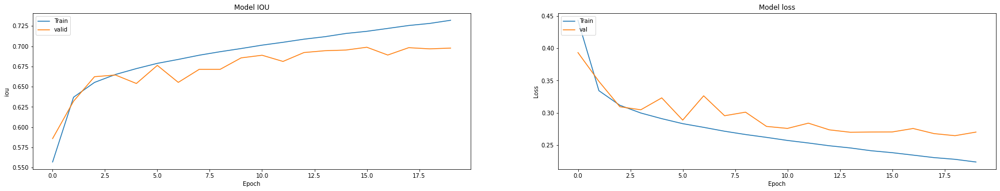

In [ ]:
plot_performance(history)

In [ ]:
model = Unet('vgg16', encoder_weights='imagenet', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)

In [ ]:
model.load_weights('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/vgg_16_augment/weights-16-0.699.h5')

### 9.2.3 Prediction on valid images

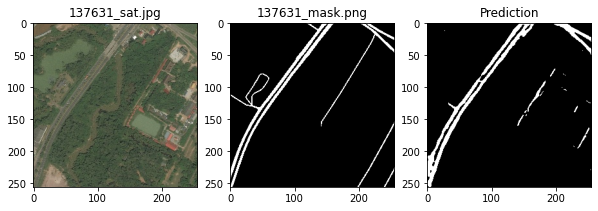

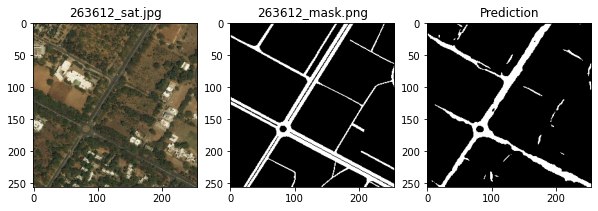

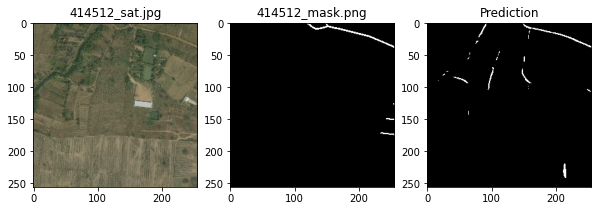

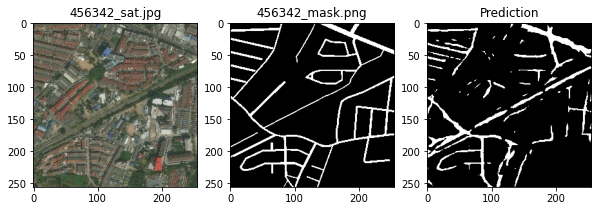

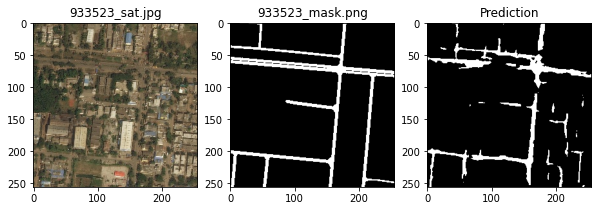

In [ ]:
predict_valid(model,n=5)

### 9.2.4 Prediction on test images

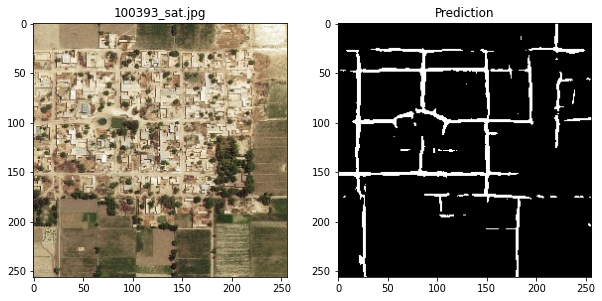

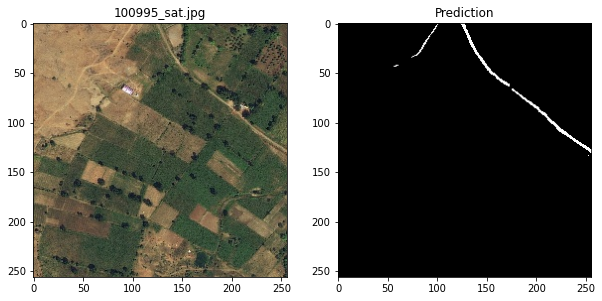

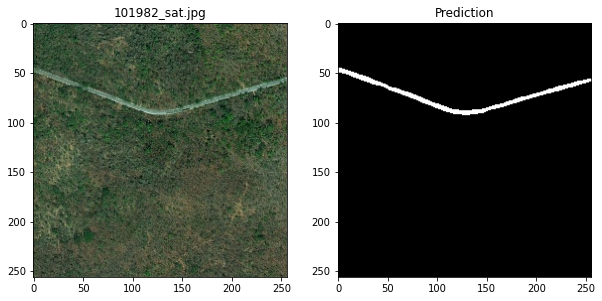

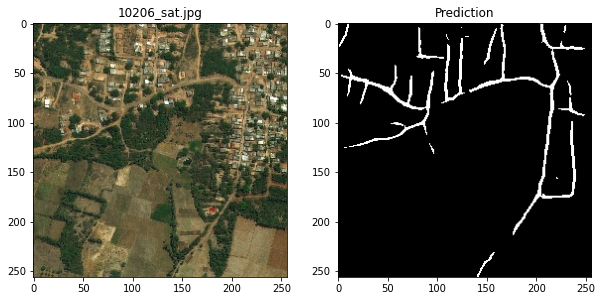

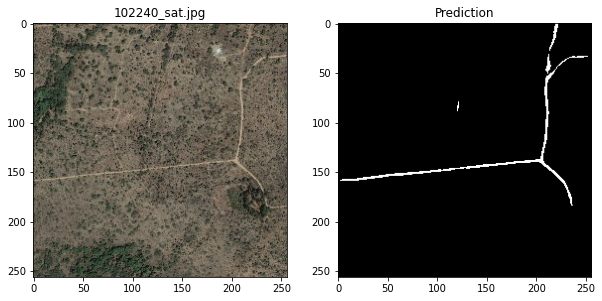

In [ ]:
predict_test(model,n=5)

## 9.3 InceptionV3

### 9.3.1 Training

In [ ]:
history = train_model(backbone ='inceptionv3', Augment = True, root_folder ='InceptionV3_augment')

Epoch 1/25
155/155 [==============================] - ETA: 0s - loss: 0.4615 - iou_score: 0.5519
Epoch 00001: val_iou_score improved from -inf to 0.59999, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/InceptionV3_augment/weights-01-0.600.h5
155/155 [==============================] - 97s 628ms/step - loss: 0.4615 - iou_score: 0.5519 - val_loss: 0.3757 - val_iou_score: 0.6000
Epoch 2/25
155/155 [==============================] - ETA: 0s - loss: 0.3266 - iou_score: 0.6426
Epoch 00002: val_iou_score improved from 0.59999 to 0.63754, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/InceptionV3_augment/weights-02-0.638.h5
155/155 [==============================] - 96s 616ms/step - loss: 0.3266 - iou_score: 0.6426 - val_loss: 0.3351 - val_iou_score: 0.6375
Epoch 3/25
155/155 [==============================] - ETA: 0s - loss: 0.3049 - iou_score: 0.6606
Epoch 00003: val_iou_score improved from 0.63754 to 0.66297, sav

In [ ]:
#save metrics

#file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/InceptionV3_augment/history.json", "w")
#json.dump(history.history, file)
#file.close()

### 9.3.2 Plot performance

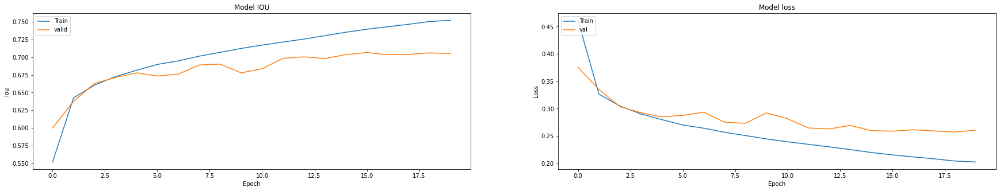

In [ ]:
plot_performance(history)

In [ ]:
model = Unet('inceptionv3', encoder_weights='imagenet', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)

In [ ]:
model.load_weights('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/InceptionV3_augment/weights-16-0.707.h5')

### 9.3.3 Prediction on valid images

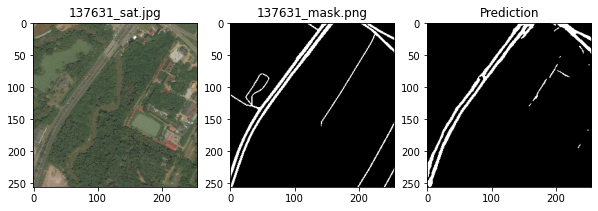

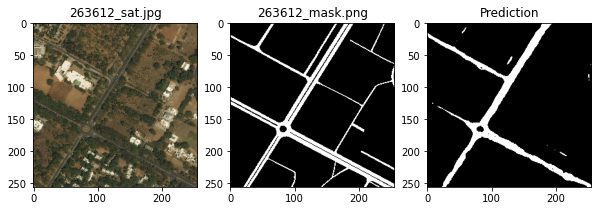

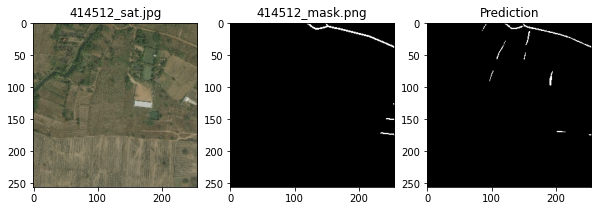

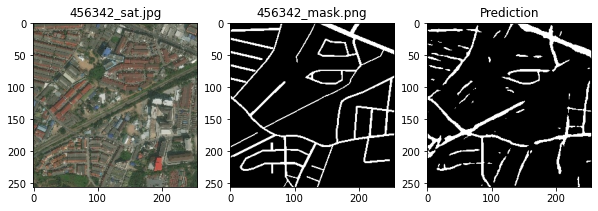

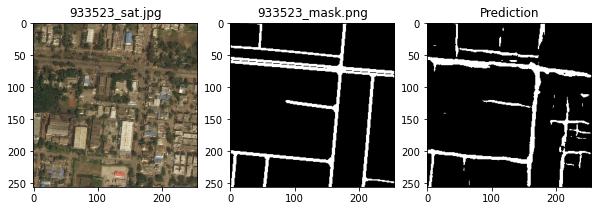

In [ ]:
predict_valid(model,n=5)

### 9.3.4 Prediction on test images

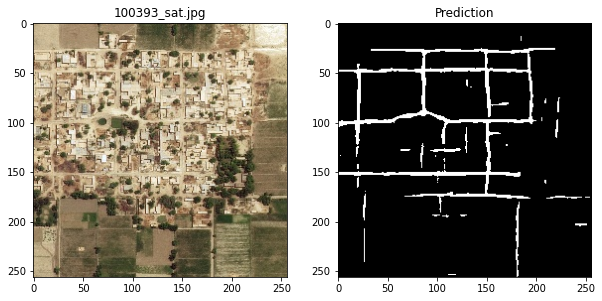

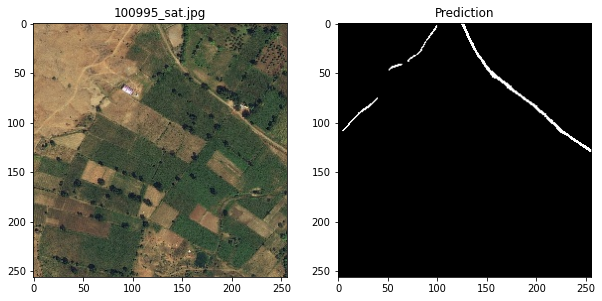

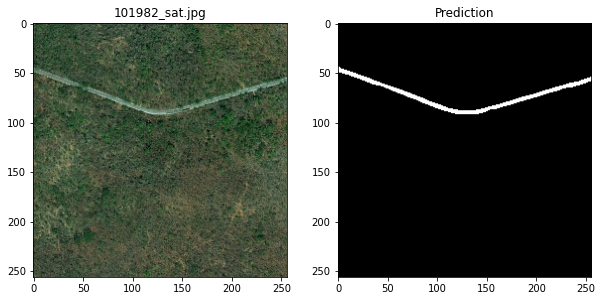

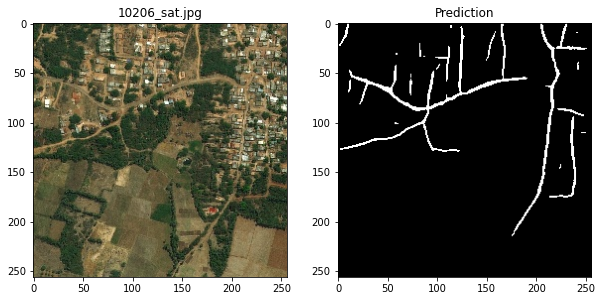

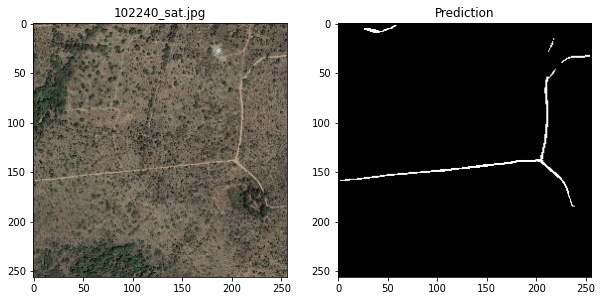

In [ ]:
predict_test(model,n=5)

## 9.4 Densenet

### 9.4.1 Training

In [ ]:
history = train_model(backbone ='densenet201', Augment = True, root_folder = 'densenet_201_augment')

74842112/74836368 [==============================] - 1s 0us/step
Epoch 1/25
155/155 [==============================] - ETA: 0s - loss: 0.4667 - iou_score: 0.5463
Epoch 00001: val_iou_score improved from -inf to 0.57668, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/densenet_201_augment/weights-01-0.577.h5
155/155 [==============================] - 133s 857ms/step - loss: 0.4667 - iou_score: 0.5463 - val_loss: 0.4072 - val_iou_score: 0.5767
Epoch 2/25
155/155 [==============================] - ETA: 0s - loss: 0.3161 - iou_score: 0.6513
Epoch 00002: val_iou_score improved from 0.57668 to 0.62128, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/densenet_201_augment/weights-02-0.621.h5
155/155 [==============================] - 134s 864ms/step - loss: 0.3161 - iou_score: 0.6513 - val_loss: 0.3621 - val_iou_score: 0.6213
Epoch 3/25
155/155 [==============================] - ETA: 0s - loss: 0.2880 - iou_score: 0.

In [ ]:
#save metrics

#file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/densenet_201_augment/history.json", "w")
#json.dump(history.history, file)
#file.close()

### 9.4.2 Plot performance

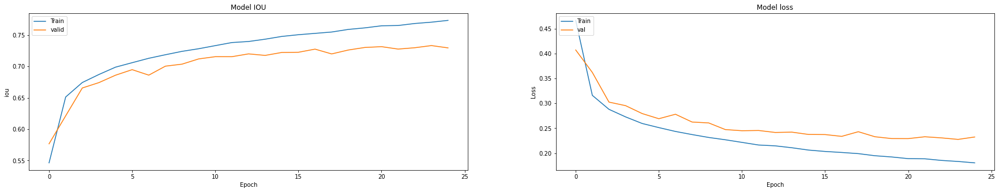

In [ ]:
plot_performance(history)

In [ ]:
model = Unet('densenet201', encoder_weights='imagenet', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)

In [ ]:
model.load_weights('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/densenet_201_augment/weights-24-0.733.h5')

### 9.4.3 Prediction on valid images

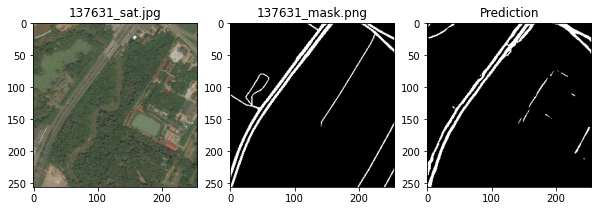

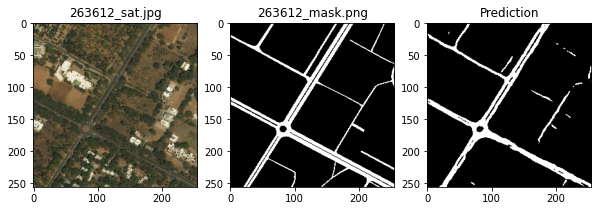

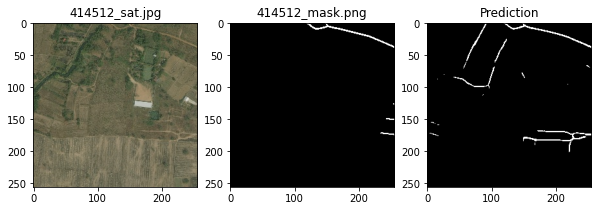

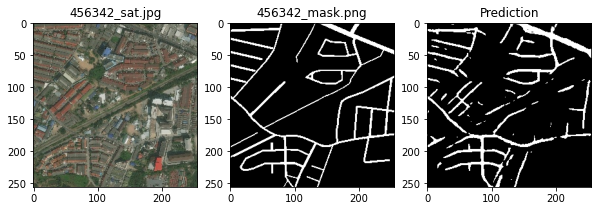

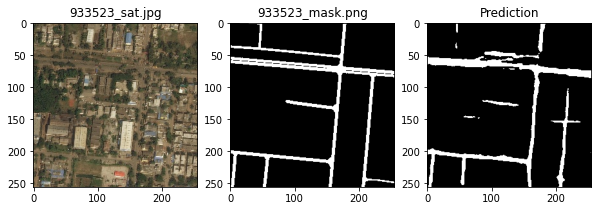

In [ ]:
predict_valid(model,n=5)

### 9.4.4 Prediction on test images

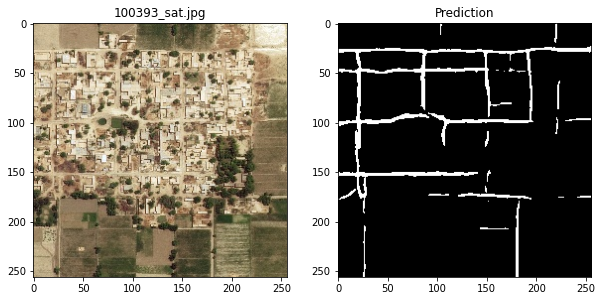

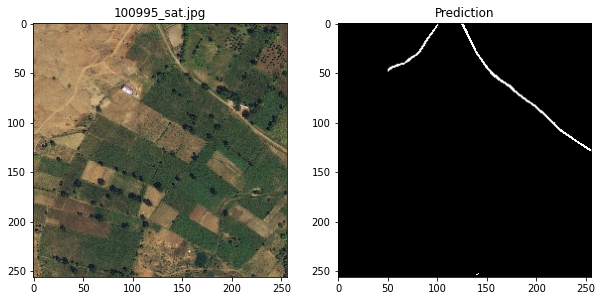

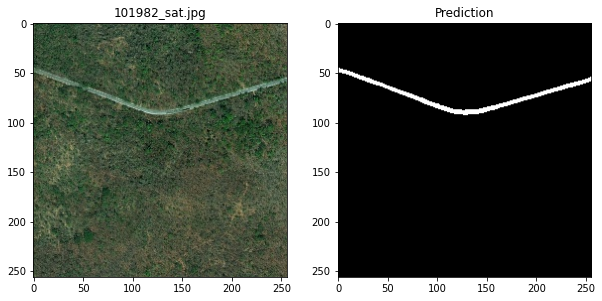

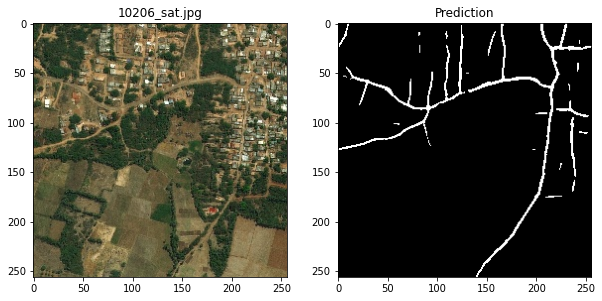

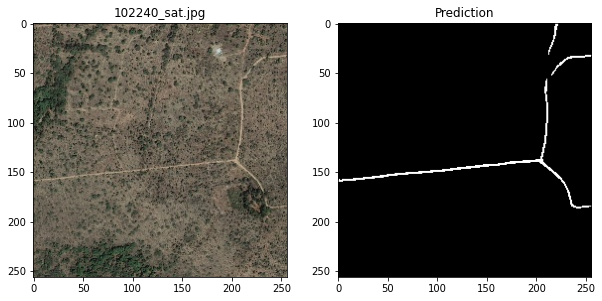

In [ ]:
predict_test(model,n=5)

## 9.5 Custom U-Net 

### 9.5.1 Training

In [ ]:
#created a model that takes input shape as (256,256,3)
model_unet = build_unet((256,256,3))

In [ ]:
history = train_model(model = model_unet, backbone = None, Augment = True, root_folder = 'U_Net_augment')

Epoch 1/25
155/155 [==============================] - ETA: 0s - loss: 0.5002 - iou_score: 0.5166
Epoch 00001: val_iou_score improved from -inf to 0.52013, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/U_Net_augment/weights-01-0.520.h5
155/155 [==============================] - 282s 2s/step - loss: 0.5002 - iou_score: 0.5166 - val_loss: 0.5429 - val_iou_score: 0.5201
Epoch 2/25
155/155 [==============================] - ETA: 0s - loss: 0.3655 - iou_score: 0.6135
Epoch 00002: val_iou_score improved from 0.52013 to 0.58036, saving model to /content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/U_Net_augment/weights-02-0.580.h5
155/155 [==============================] - 288s 2s/step - loss: 0.3655 - iou_score: 0.6135 - val_loss: 0.4193 - val_iou_score: 0.5804
Epoch 3/25
155/155 [==============================] - ETA: 0s - loss: 0.3094 - iou_score: 0.6578
Epoch 00003: val_iou_score improved from 0.58036 to 0.61595, saving model to /co

In [ ]:
#save metrics

#file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/U_Net_augment/history.json", "w")
#json.dump(history.history, file)
#file.close()

### 9.5.2 Plot performance

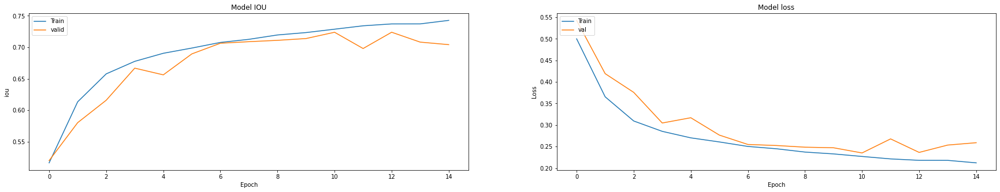

In [ ]:
plot_performance(history)

In [ ]:
model_unet = build_unet((256,256,3))

In [ ]:
model_unet.load_weights('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/U_Net_augment/weights-13-0.724.h5')

### 9.5.3 Prediction on valid images

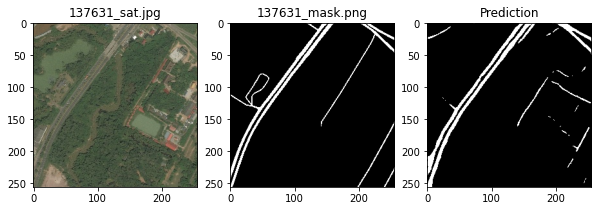

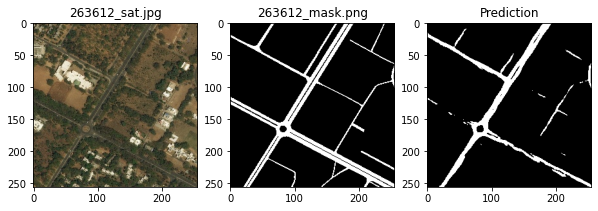

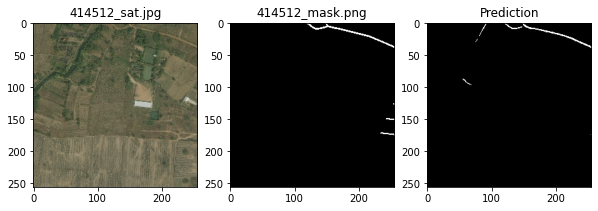

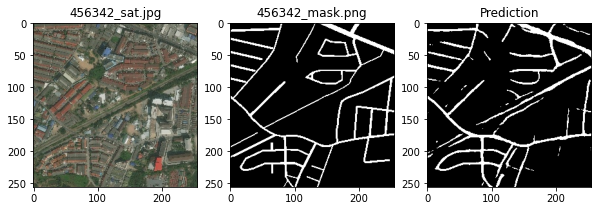

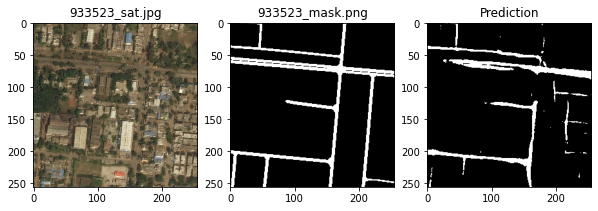

In [ ]:
predict_valid(model_unet,n=5)

### 9.5.4 Prediction on test images

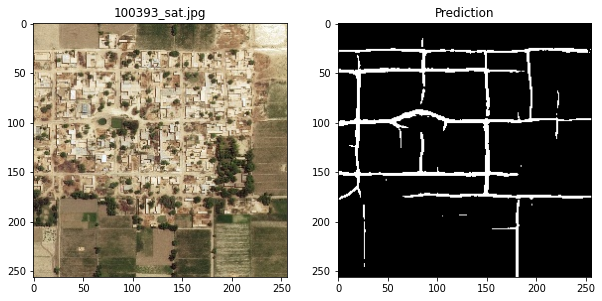

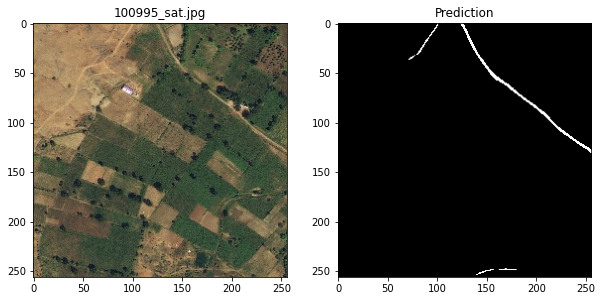

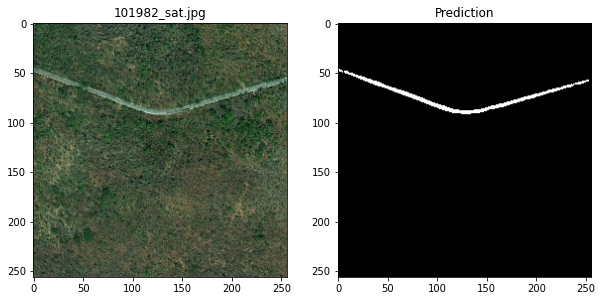

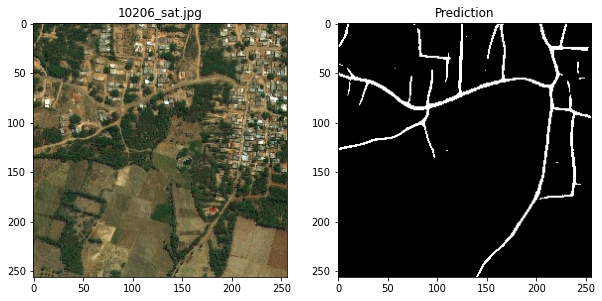

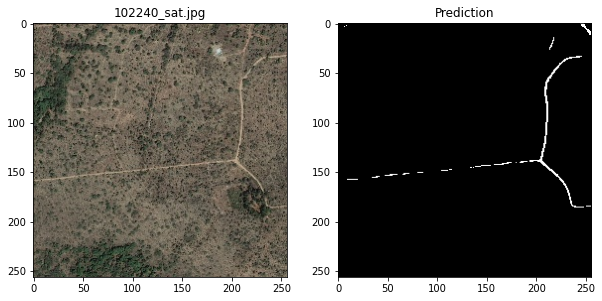

In [ ]:
predict_test(model_unet,n=5)

# 10. Comparision of performance plots of models

In [60]:
def plot_IOUAugment_vs_IOUnoAugment(models, metric):
  
  for model in models:
    file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/"+ model[0] +"/history.json", "r")
    iou_no_augment = file.read()
    iou_no_augment = json.loads(iou_no_augment)
    file.close()

    file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/"+ model[1] +"/history.json", "r")
    iou_augment = file.read()
    iou_augment = json.loads(iou_augment)
    file.close()
 
    plt.figure(figsize=(20, 3))
    plt.subplot(121)
    plt.plot(iou_no_augment[metric])
    plt.plot(iou_no_augment['val_' + metric])
    plt.title(model[0])
    plt.ylabel('iou')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'valid'], loc='upper left')

    plt.subplot(122)
    plt.plot(iou_augment[metric])
    plt.plot(iou_augment['val_' + metric])
    plt.title(model[1])
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'val'], loc='upper left')
    
    plt.show()

In [11]:
#listing out all the models

models = [("Resnet_34_no_augment","Resnet_34_augment"),
          ("vgg_16_no_augment","vgg_16_augment"),
          ("InceptionV3_no_augment","InceptionV3_augment"),
          ("densenet_201_no_augment","densenet_201_augment"),
          ("U_Net_no_augment","U_Net_augment")]

## 10.1 NO Augmentation vs Augmentation

### 10.1.1 IOU plots

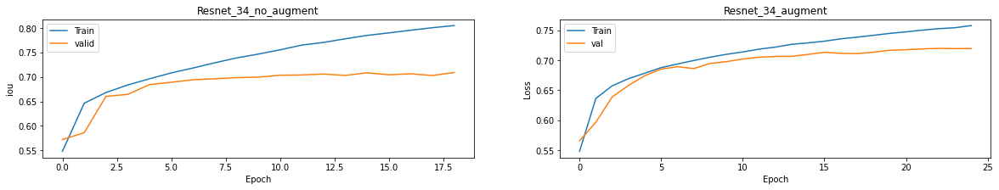

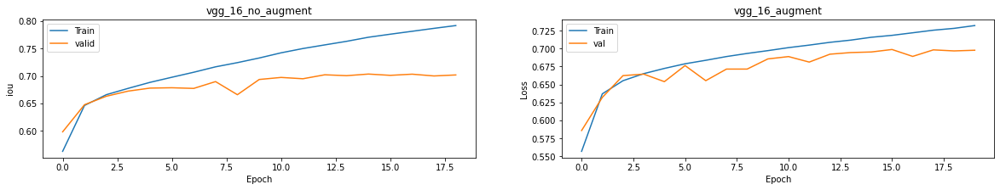

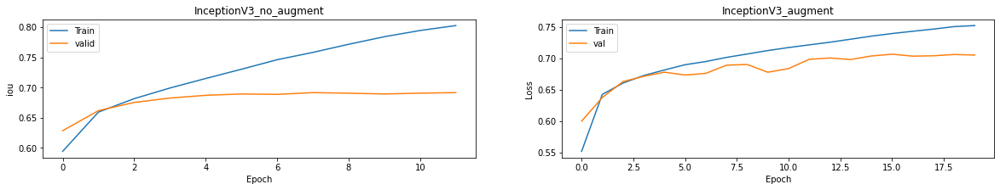

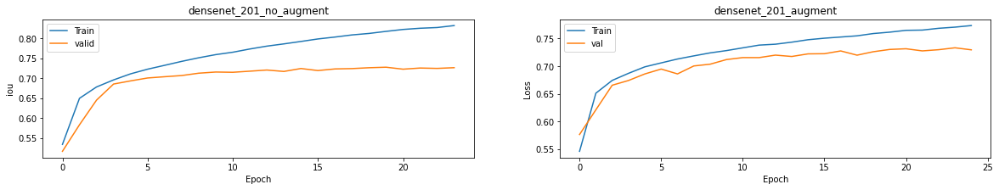

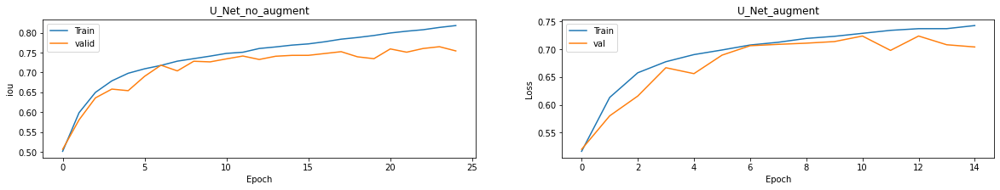

In [61]:
plot_IOUAugment_vs_IOUnoAugment(models,metric='iou_score')

### observations

* From the above plots we can clearly observe that models trained without augmentation are little overfitted compared to models trained with augmentation


* So, After seeing the iou values of all the plots we can observe that custom U-net model is producing better iou value and there seems like no much difference between custom U-Net model plots with and without Augmentation




### 10.1.2 Loss plots

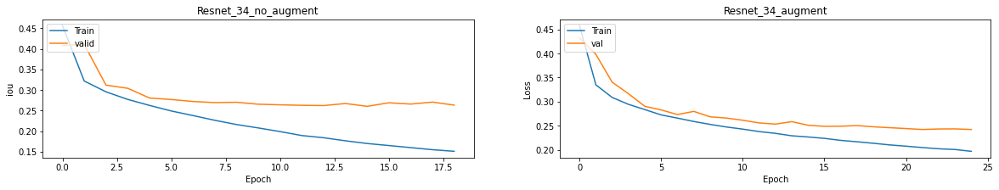

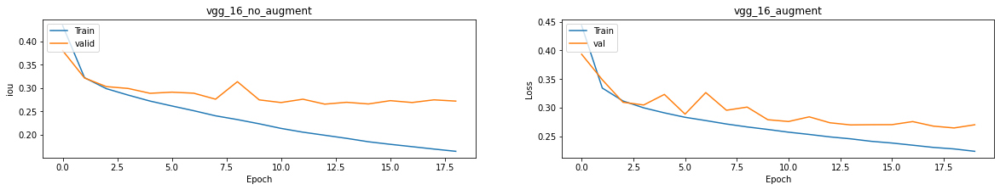

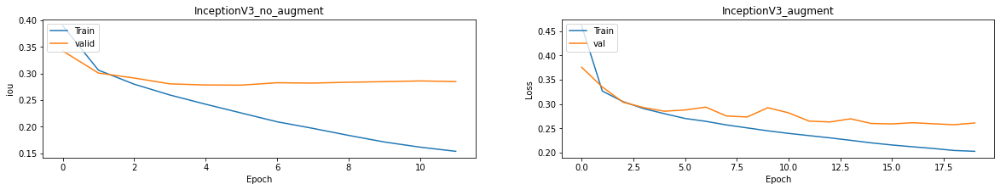

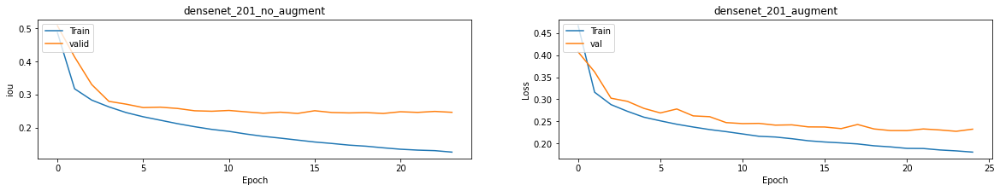

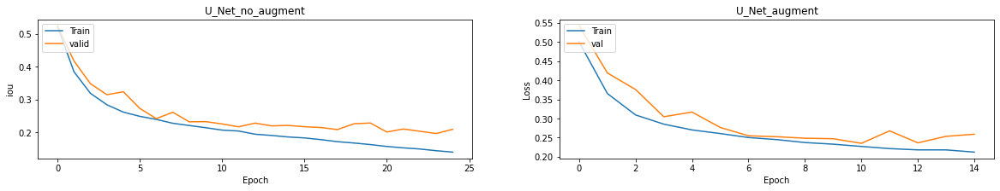

In [62]:
plot_IOUAugment_vs_IOUnoAugment(models,metric='loss')

### observations

* From the above plots we can clearly observe that models trained without augmentation are little overfitted compared to models trained with augmentation


* So, After seeing the loss values of all the plots we can observe that custom U-net model is producing better loss value and there seems like no much difference between custom U-Net model plots with and without Augmentation




# 11. Best metrics of models

In [85]:
from prettytable import PrettyTable
  

myTable = PrettyTable(["Model", "val-IOU", "val-loss"])

models = np.sort(os.listdir('/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights'))
  
iou_metrics = []
loss_metrics = []

for model in models :
  
  file = open("/content/drive/MyDrive/Colab_Notebooks/DeepGlobeRoadExtraction/weights/"+ model +"/history.json", "r")
  metrics = file.read()
  metrics = json.loads(metrics)
  file.close()
  
  best_val_iou_score = np.round(max(metrics['val_iou_score']),3)
  best_val_loss = np.round(min(metrics['val_loss']),3)
  
  iou_metrics.append(best_val_iou_score)
  loss_metrics.append(best_val_loss)

  myTable.add_row([model,best_val_iou_score,best_val_loss])

  
print(myTable)

best_iou_metric = max(iou_metrics)
best_iou_metric_index = np.argmax(iou_metrics)
best_loss_metric = loss_metrics[best_iou_metric_index]
best_model = models[best_iou_metric_index]
print("\n")
print("*"*50)
print("Best performed metric - " + best_model )
print("val_iou_score - " + str(best_iou_metric))
print("val_loss - " + str(best_loss_metric))

+-------------------------+---------+----------+
|          Model          | val-IOU | val-loss |
+-------------------------+---------+----------+
|   InceptionV3_augment   |  0.707  |  0.257   |
|  InceptionV3_no_augment |  0.692  |  0.278   |
|    Resnet_34_augment    |   0.72  |  0.242   |
|   Resnet_34_no_augment  |  0.709  |   0.26   |
|      U_Net_augment      |  0.724  |  0.235   |
|     U_Net_no_augment    |  0.765  |  0.196   |
|   densenet_201_augment  |  0.733  |  0.228   |
| densenet_201_no_augment |  0.728  |  0.243   |
|      vgg_16_augment     |  0.699  |  0.265   |
|    vgg_16_no_augment    |  0.703  |  0.265   |
+-------------------------+---------+----------+


**************************************************
Best performed metric - U_Net_no_augment
val_iou_score - 0.765
val_loss - 0.196


# 12. Conclusions
 
*   So, In this Advanced deep learning modelling all the models are trained with and without augmentation techniques along transfer learning where all encoder backbone pretrained models are already pretrained on imagenet datasets

*   So, here we trained our satellite image datasets using state of the art deep learing models like U-Net encoder architecture and their backbones are used as resnet34, vgg16, inceptionV3, densenet201 etc. and along with these we also trained using our custom U-Net architecture.


*   After training we plotted No Augmentation vs Augmentation - IOU and loss metric plots. So, from the above plots we can clearly infer that  models trained with No Augmentation are little overfitted compared to models trained with Augmentation.

* After seeing all plots and scores of metrics in above pretty table our custom U-Net architecture model without augmentation is outperformed and gave better validation IOU score = 0.765 and loss = 0.196

* So, After training all the models, plotting the metrics and seeing the observations in pretty table we can conclude that our custom created U-Net model without augmentation is outperformed and stood as best model.










